In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np



import plotly.express as px
import matplotlib.pyplot as plt

data = pd.read_csv("water.csv")
print("The sample of data is: ", (data.shape))
data.head()

The sample of data is:  (3276, 10)


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890456,20791.31898,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.05786,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.54173,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.41744,8.059332,356.886136,363.266516,18.436525,100.341674,4.628771,0
4,9.092223,181.101509,17978.98634,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [2]:
# Imputing Null Values with median

data['ph'] = data['ph'].fillna(np.nanmedian(data['ph']))
data['Sulfate'] = data['Sulfate'].fillna(np.nanmedian(data['Sulfate']))
data['Trihalomethanes'] = data['Trihalomethanes'].fillna(np.nanmedian(data['Trihalomethanes']))

In [3]:
data.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [4]:
X = data.iloc[:,:9]
y = data[['Potability']]

In [5]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [6]:
# Missing data have been successfully imputed
data.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [7]:
print("The sample of data is: ", (data.shape))
data.head()

The sample of data is:  (3276, 10)


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.036752,204.890456,20791.31898,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.05786,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.54173,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.41744,8.059332,356.886136,363.266516,18.436525,100.341674,4.628771,0
4,9.092223,181.101509,17978.98634,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [8]:
# No Duplicates
data.drop_duplicates()
print("The sample of data is: ", (data.shape))

The sample of data is:  (3276, 10)


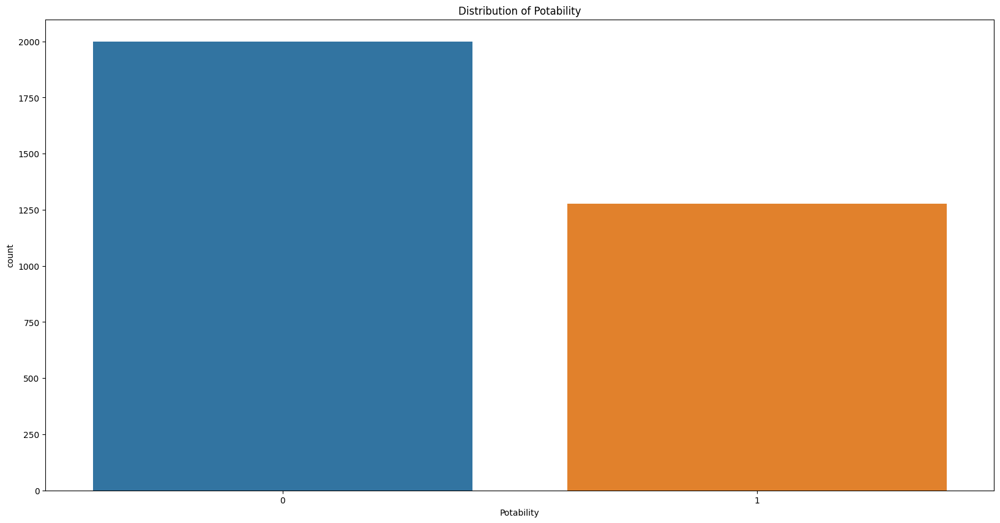

In [9]:
plt.figure(figsize=(20, 10))
sns.countplot(x=data.Potability)
plt.title("Distribution of Potability")
plt.show()

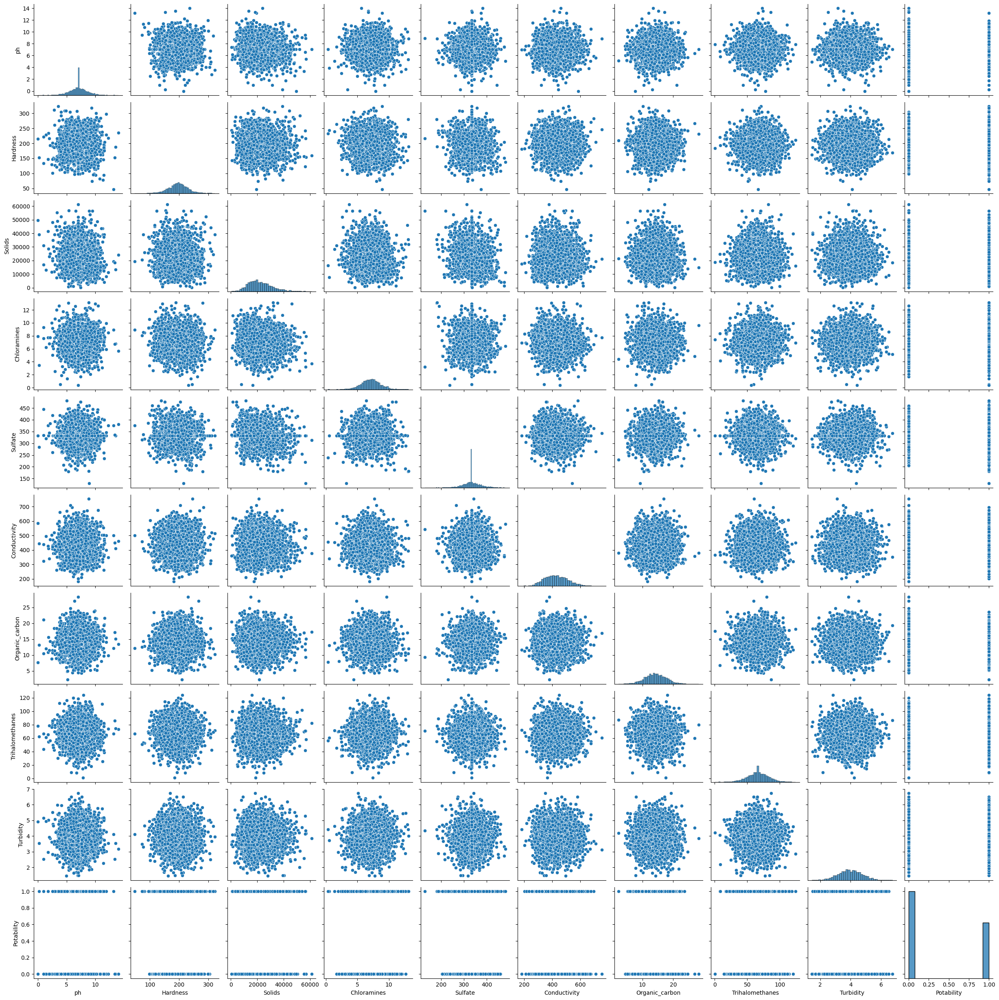

In [10]:
sns.pairplot(data)

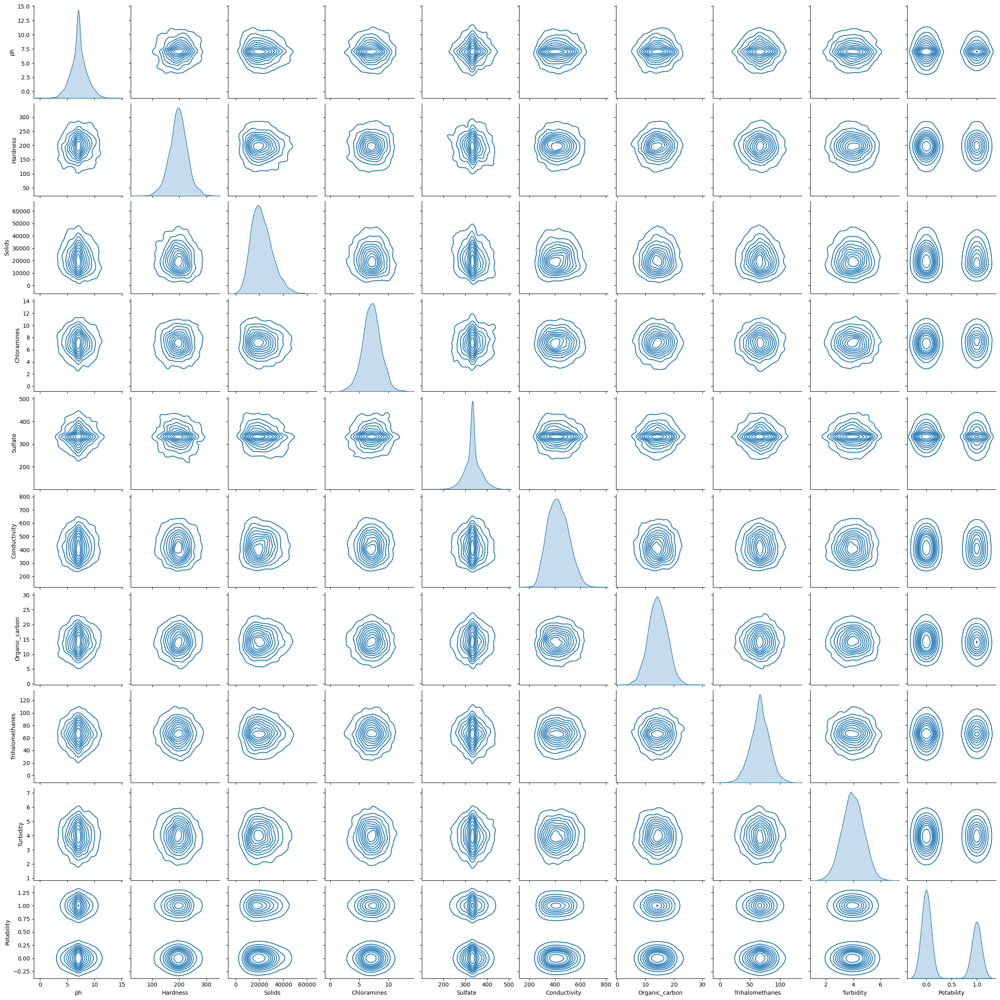

In [11]:
sns.pairplot(data,kind = 'kde')

In [12]:
# Histogram Function
def histogram(attr):
    plot = px.histogram(data, x = attr,color = "Potability", 
                      title= ("Factor {} Affecting Water Quality").format(attr))
    plot.show()

In [13]:

histogram("ph")

In [14]:
histogram("Hardness")

In [15]:
histogram("Solids")

In [16]:
histogram("Turbidity")

In [17]:
histogram("Chloramines")

In [18]:
histogram("Sulfate")

In [19]:
histogram("Conductivity")

In [20]:
histogram("Organic_carbon")

In [21]:
histogram("Trihalomethanes")

In [22]:
data.isna().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [23]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn import model_selection
from sklearn.metrics import classification_report,accuracy_score
import numpy as np
import pandas as pd
def run_exps(X_train: pd.DataFrame , y_train: pd.DataFrame, X_test: pd.DataFrame, y_test: pd.DataFrame) -> pd.DataFrame:
    
    dataframe = []
    ml_models = [
          ('Random Forest', RandomForestClassifier()),
          ('K-Nearest Neighbor', KNeighborsClassifier())
        ]
    results = []
    names = []
    scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
    target_names = ['portable', 'non-portable']
    for ml_mod, model in ml_models:
        kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
        cv_results = model_selection.cross_validate(model, X_train, y_train, cv=kfold, scoring=scoring)
        clf = model.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        print(ml_mod)
        print(classification_report(y_test, y_pred, target_names=target_names))
        results.append(cv_results)
        names.append(ml_mod)
        this_df = pd.DataFrame(cv_results)
        this_df['model'] = ml_mod
        dataframe.append(this_df)
    final = pd.concat(dataframe, ignore_index=True)
    return final

In [24]:
final = run_exps(X_train,y_train.values.ravel(),X_test,y_test.values.ravel())

Random Forest
              precision    recall  f1-score   support

    portable       0.69      0.87      0.77       680
non-portable       0.60      0.32      0.42       402

    accuracy                           0.67      1082
   macro avg       0.64      0.60      0.59      1082
weighted avg       0.65      0.67      0.64      1082

K-Nearest Neighbor
              precision    recall  f1-score   support

    portable       0.63      0.70      0.67       680
non-portable       0.38      0.31      0.35       402

    accuracy                           0.56      1082
   macro avg       0.51      0.51      0.51      1082
weighted avg       0.54      0.56      0.55      1082




  accuracy is:0.6802218114602587


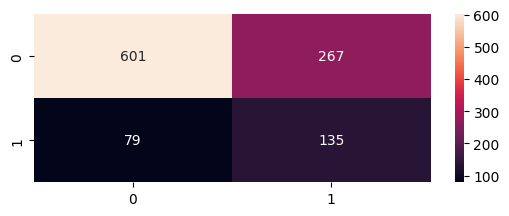

In [25]:
model = RandomForestClassifier()
clf = model.fit(X_train, y_train.values.ravel())
y_pred = clf.predict(X_test)
y_pred_proba = clf.predict_proba(X_test)
tar_name = ['0', '1']

plt.subplot(2,1,1)
sns.heatmap(confusion_matrix(y_pred, y_test), annot=True, fmt='g')
print('\n  accuracy is:{}'.format(accuracy_score(y_pred, y_test)))

In [26]:
cscore = [x[0] for x in y_pred_proba] 


  accuracy is:0.5582255083179297


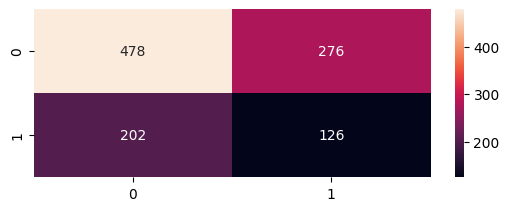

In [27]:
model = KNeighborsClassifier()
clf = model.fit(X_train, y_train.values.ravel())
y_pred = clf.predict(X_test)
y_pred_proba = clf.predict_proba(X_test)
tar_name = ['0', '1']

plt.subplot(2,1,1)
sns.heatmap(confusion_matrix(y_pred, y_test), annot=True, fmt='g')
print('\n  accuracy is:{}'.format(accuracy_score(y_pred, y_test)))

In [28]:

X_test['y_pred'] = y_pred
X_test['y_pred_proba'] = cscore

In [29]:
X_test.head(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,y_pred,y_pred_proba
2947,7.036752,183.521107,20461.252710,7.333212,333.119476,356.369022,20.179029,67.019903,4.886634,0,0.61
2782,6.643159,188.913541,32873.820020,6.791509,333.848842,336.561501,14.706810,67.844849,4.562198,0,0.69
1644,7.846058,224.058877,23264.109970,5.922367,300.402620,387.971336,13.406737,43.075186,2.487969,0,0.67
70,7.160467,183.089310,6743.346066,3.803036,277.599099,428.036344,9.799625,90.035374,3.884891,1,0.54
2045,6.615350,179.240661,26392.863610,9.309160,333.073546,496.363562,12.786595,78.262369,4.453443,0,0.62
263,13.175402,47.432000,19237.949680,8.907020,375.147315,500.245952,12.083896,66.622485,4.106924,0,0.28
1042,5.499489,230.308775,13902.968650,9.619575,352.084333,442.167006,14.740787,66.622485,5.846827,0,0.38
2263,11.235426,178.596496,33773.107060,9.063042,327.650960,425.868039,17.986255,58.986652,5.147055,1,0.58
450,7.036752,139.331152,2912.211247,10.338234,343.318021,532.885196,11.078341,42.172824,4.093098,1,0.36
1832,7.036752,233.846621,32496.640220,6.637384,347.986448,424.649773,13.028000,55.983973,4.296189,0,0.79
